# MODELOS PREDICTIVOS: AGUA

Notebook con el modelo predictivo de Random Forest para la variable 'agua' además de su predicción para valores recientes. 



In [96]:
# imports de RF
import pandas as pd
import warnings
import numpy as np
import plotly.graph_objs as go
import plotly.offline as pyo
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import plotly.graph_objects as go
from sklearn.inspection import permutation_importance
from sklearn.ensemble import RandomForestRegressor
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

from joblib import dump, load

In [97]:
# Especifica la ruta del archivo Excel
archivo_excel_1 = r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\datos\hastaMayo_M1.xlsx'
archivo_excel_2 = r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\datos\hastaMayo_M2.xlsx'

# Carga los datos del archivo Excel en un DataFrame
df_1 = pd.read_excel(archivo_excel_1)
df_2 = pd.read_excel(archivo_excel_2)

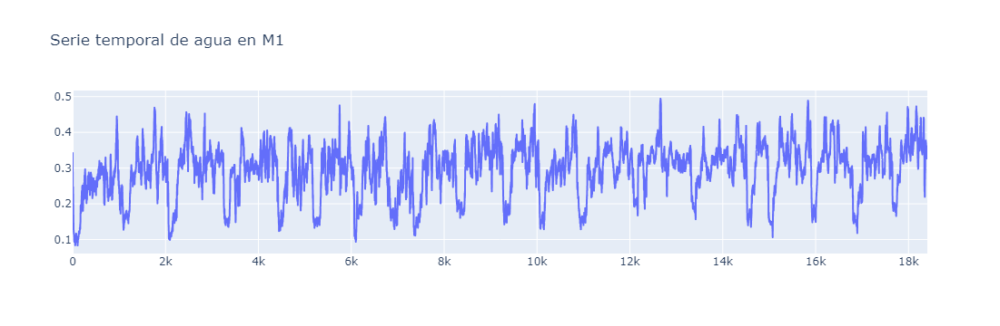

In [98]:
fig = go.Figure()
fig.add_trace(go.Scattergl(x=df_1.index,y=df_1.agua_norm,name='norm'))
# fig.add_trace(go.Scattergl(x=df_1.index,y=df_1.agua_norm_lag_1,name='lag1'))
# fig.add_trace(go.Scattergl(x=df_1.index,y=df_1.agua_norm_lag_2,name='lag2'))
fig.update_layout(title='Serie temporal de agua en M1')

fig.show()

# Random Forest MOLINO 1
Primero vamos a hacer un modelo con todo y luego iremos descartando las variables 'irrelevantes'. 

In [99]:
# Definir la variable objetivo y las características para entrenamiento y test
col_y = 'agua_norm'

# Definir las columnas de los conjuntos X
cols_x = [
    'inicioSemana', 'bentonita_norm', 'finos_norm', 'premez_norm', 'premez_norm_lag_1', 
    'finos_norm_lag_1', 'tempArena_norm',
    'tempArena_norm_lag_1', 'humedadArenaAditivos_norm_lag_1', 'tempArenaAditivos_norm_lag_1', 
    'tempAgua_norm_lag_1', 'tiempoVacio_norm_lag_1', 
    'compactabilidad_norm_lag_1', 'cizalla_norm_lag_1', 
    'tempMezclaCalc_norm_lag_1', 'humedadMezclaCalc_norm_lag_1', 
    'bentonita_norm_lag_1','bentonita_norm_lag_2', 'premez_norm_lag_2', 'finos_norm_lag_2', 
    'tempArena_norm_lag_2', 'tempArena_norm_lag_2', 
    'humedadArenaAditivos_norm_lag_2', 
    'tempArenaAditivos_norm_lag_2', 'tempAgua_norm_lag_2', 
    'tiempoVacio_norm_lag_2', 'compactabilidad_norm_lag_2', 
    'cizalla_norm_lag_2', 'tempMezclaCalc_norm_lag_2', 
    'humedadMezclaCalc_norm_lag_2', 'agua_norm_lag_1', 'agua_norm_lag_2'
]

X1 = df_1[cols_x]
y1 = df_1[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_1))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data1 = df_1.iloc[:indice_80_percent, :]
test_data1 = df_1.iloc[indice_80_percent:, :]

X_train1 = train_data1[cols_x]
X_test1 = test_data1[cols_x]
y_train1 = train_data1[col_y]
y_test1 = test_data1[col_y]

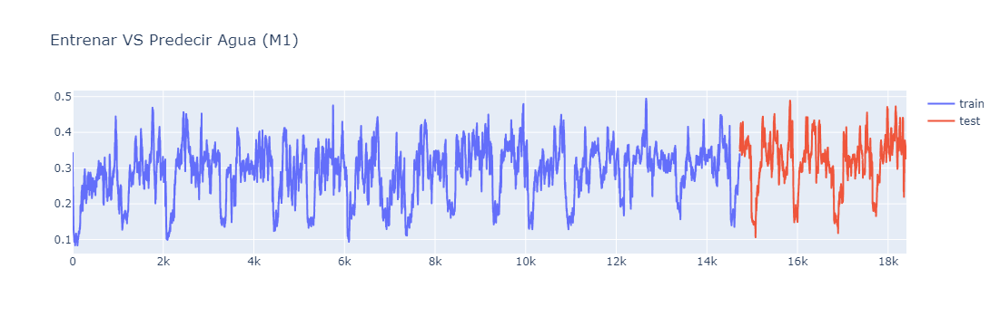

In [100]:
# aquí muestro con qué entrenamos al modelo y qué es lo que queremos predecir
fig = go.Figure()
fig.add_trace(go.Scattergl(x=X_train1.index, y=y_train1, mode='lines', name='train'))
fig.add_trace(go.Scattergl(x=X_test1.index, y=y_test1, mode='lines', name='test'))
fig.update_layout(title='Entrenar VS Predecir Agua (M1)')

fig.show()

In [101]:
# modelo random forest
rf_agua1 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua1.fit(X_train1, y_train1)
y_pred1 = rf_agua1.predict(X_test1)

# analizamos los residuos
res_test1 = y_test1 - y_pred1 

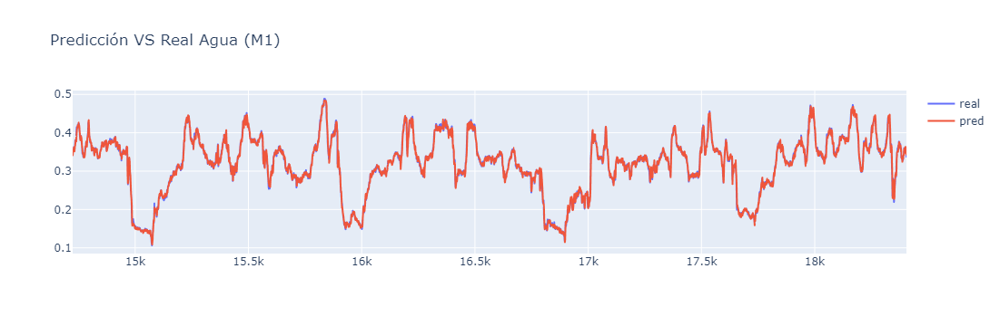

In [102]:
fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test1.index, y=y_test1, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test1.index, y=y_pred1, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua (M1)')

fig_pred1.show()

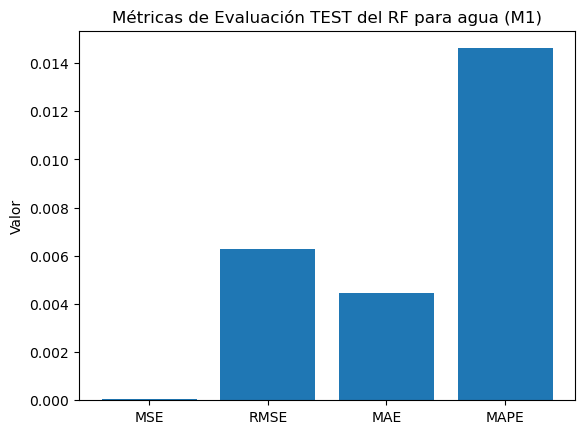

<Axes: >

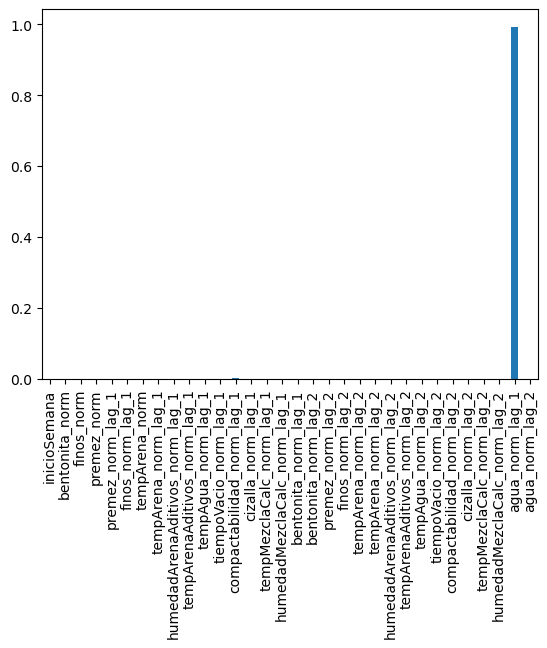

In [103]:
# Evaluación del modelo

######################################## MEZCLADORA 1 ########################################
mae_test1 = mean_absolute_error(y_test1, y_pred1)
mse_test1 = mean_squared_error(y_test1, y_pred1)
rmse_test1 = np.sqrt(mse_test1)
mape_test1 = np.mean(np.abs(res_test1 / y_test1)[~np.isinf(np.abs(res_test1 / y_test1))])

metricas_test1 = {'MSE': mse_test1, 'RMSE': rmse_test1, 'MAE': mae_test1, 'MAPE': mape_test1}
plt.bar(metricas_test1.keys(), metricas_test1.values())
plt.title('Métricas de Evaluación TEST del RF para agua (M1)')
plt.ylabel('Valor')
plt.show()

importances1 = rf_agua1.feature_importances_

rf_imp1 = pd.Series(importances1, index=cols_x)
rf_imp1.plot.bar()

In [104]:
# quito los lags de TODOS

# df_red = df_1.iloc[:,:36]
# df_red.info()

In [105]:
# Definir la variable objetivo y las características para entrenamiento y test
col_y = 'agua_norm'

X1 = df_1.drop(columns=['agua_norm', 'codigoRef1', 'agua'])
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y1 = df_1[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_1))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data1 = df_1.iloc[:indice_80_percent, :]
test_data1 = df_1.iloc[indice_80_percent:, :]

X_train1 = train_data1.drop(columns=['agua_norm', 'codigoRef1', 'agua'])
X_test1 = test_data1.drop(columns=['agua_norm', 'codigoRef1', 'agua'])
y_train1 = train_data1[col_y]
y_test1 = test_data1[col_y]

In [106]:
# modelo random forest
rf_agua1 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua1.fit(X_train1, y_train1)
y_pred1 = rf_agua1.predict(X_test1)

# analizamos los residuos
res_test1 = y_test1 - y_pred1 

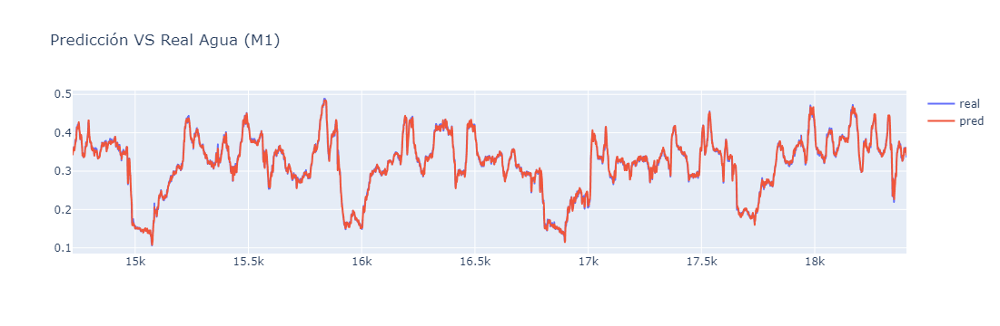

In [107]:
fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test1.index, y=y_test1, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test1.index, y=y_pred1, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua (M1)')

fig_pred1.show()

<Axes: >

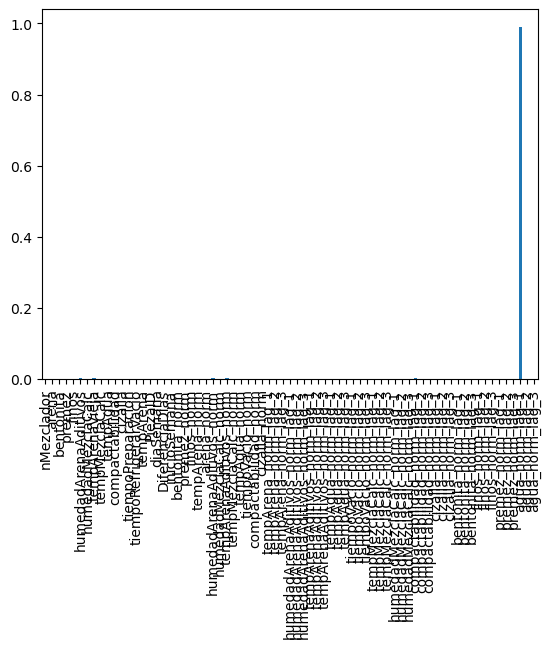

In [108]:
# Evaluación características
imp_caract = rf_agua1.feature_importances_

rf_imp = pd.Series(imp_caract, index=X1.columns)
rf_imp.plot.bar()

In [109]:
# normal
cols_guardar = ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm']

X1 = df_red[cols_guardar]
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y1 = df_red[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_red))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data1 = df_red.iloc[:indice_80_percent, :]
test_data1 = df_red.iloc[indice_80_percent:, :]

X_train1 = train_data1[cols_guardar]
X_test1 = test_data1[cols_guardar]
y_train1 = train_data1[col_y]
y_test1 = test_data1[col_y]

In [110]:
# con lag agua
cols_guardar =  ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm', 'agua_norm_lag_1']
X1 = df_1[cols_guardar]
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y1 = df_1[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_1))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data_lag = df_1.iloc[:indice_80_percent, :]
test_data_lag = df_1.iloc[indice_80_percent:, :]

X_train_lag = train_data_lag[cols_guardar]
X_test_lag = test_data_lag[cols_guardar]
y_train_lag = train_data_lag[col_y]
y_test_lag = test_data_lag[col_y]

In [111]:
# con lag agua, compact y cizalla
cols_guardar = ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm', 'agua_norm_lag_1', 'compactabilidad_norm_lag_1',
               'cizalla_norm_lag_1']

X1 = df_1[cols_guardar]
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y1 = df_1[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_1))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data_lag_2 = df_1.iloc[:indice_80_percent, :]
test_data_lag_2 = df_1.iloc[indice_80_percent:, :]

X_train_lag_2 = train_data_lag_2[cols_guardar]
X_test_lag_2 = test_data_lag_2[cols_guardar]
y_train_lag_2 = train_data_lag_2[col_y]
y_test_lag_2 = test_data_lag_2[col_y]

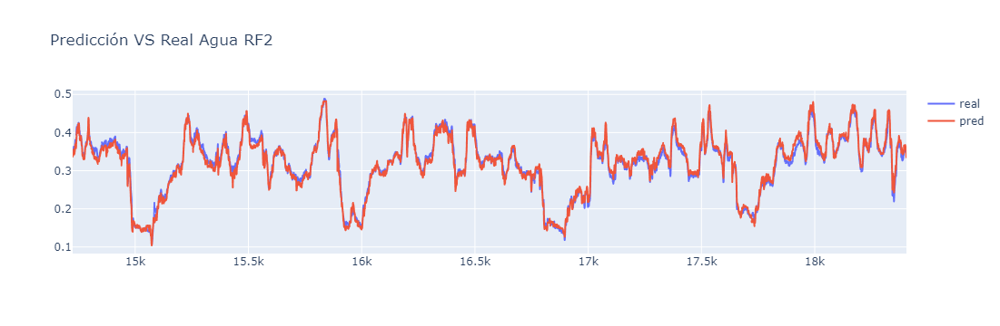

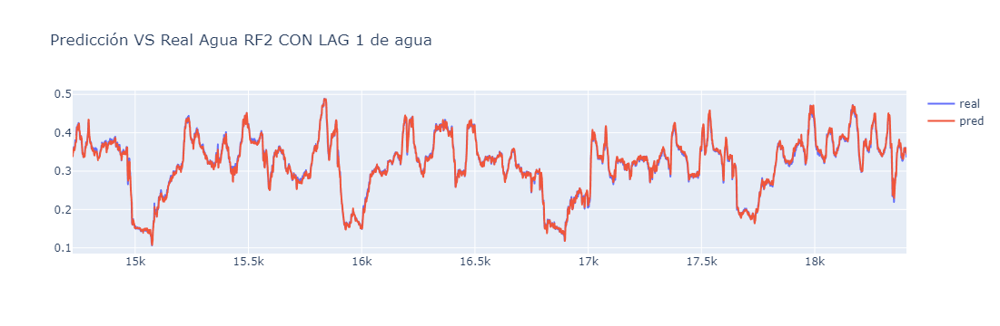

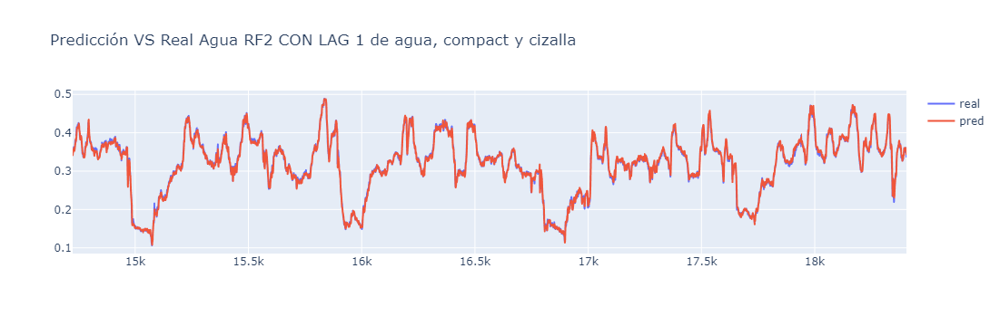

In [112]:
# normal
rf_agua2 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua2.fit(X_train1, y_train1)
y_pred2 = rf_agua2.predict(X_test1)

# analizamos los residuos
res_test1 = y_test1 - y_pred2

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test1.index, y=y_test1, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test1.index, y=y_pred2, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua RF2')

fig_pred1.show()


# con lag agua
rf_agua_lag = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua_lag.fit(X_train_lag, y_train_lag)
y_pred_lag = rf_agua_lag.predict(X_test_lag)

# analizamos los residuos
res_test_lag = y_test_lag - y_pred_lag

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test_lag.index, y=y_test1, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test_lag.index, y=y_pred_lag, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua RF2 CON LAG 1 de agua')

fig_pred1.show()


# con lag agua, compact y cizalla
rf_agua_lag_2 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua_lag_2.fit(X_train_lag_2, y_train_lag_2)
y_pred_lag_2 = rf_agua_lag_2.predict(X_test_lag_2)

# analizamos los residuos
res_test_lag_2 = y_test_lag_2 - y_pred_lag_2

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test_lag_2.index, y=y_test1, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test_lag_2.index, y=y_pred_lag_2, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua RF2 CON LAG 1 de agua, compact y cizalla')

fig_pred1.show()

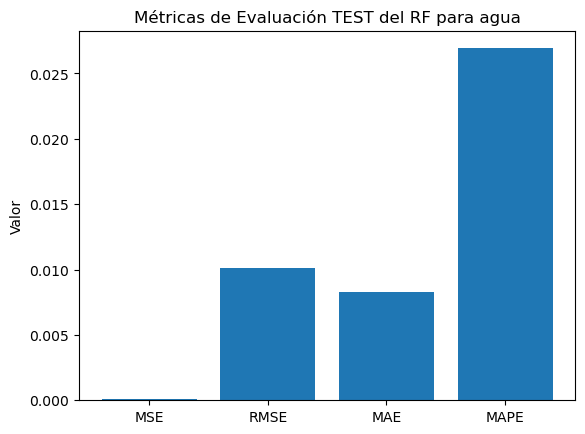

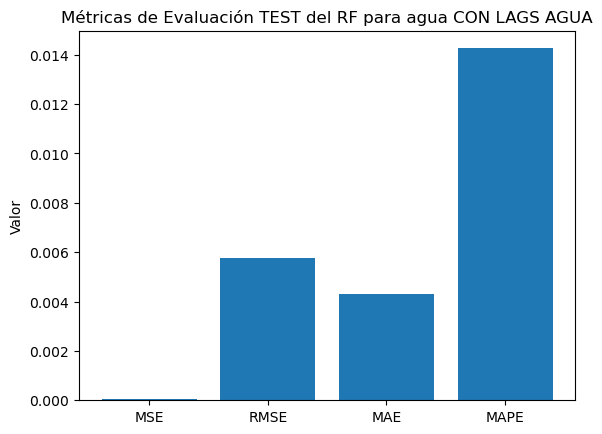

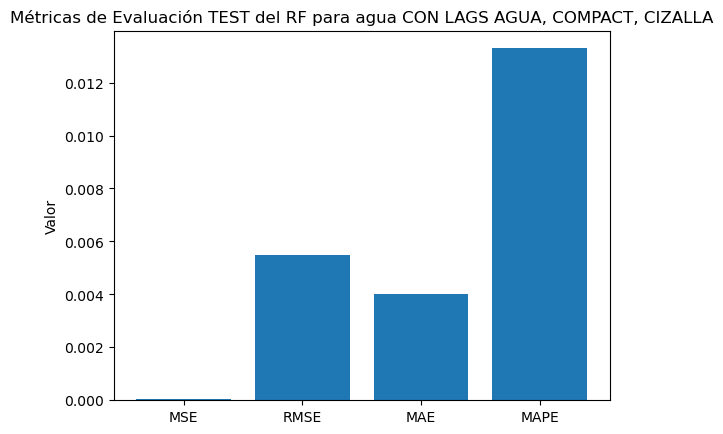

In [113]:
# Evaluación del modelo

mae_test2 = mean_absolute_error(y_test1, y_pred2)
mse_test2 = mean_squared_error(y_test1, y_pred2)
rmse_test2 = np.sqrt(mse_test2)
mape_test2 = np.mean(np.abs(res_test1 / y_test1)[~np.isinf(np.abs(res_test1 / y_test1))])

metricas_test2 = {'MSE': mse_test2, 'RMSE': rmse_test2, 'MAE': mae_test2, 'MAPE': mape_test2}
plt.bar(metricas_test2.keys(), metricas_test2.values())
plt.title('Métricas de Evaluación TEST del RF para agua')
plt.ylabel('Valor')
plt.show()

mae_test_lag = mean_absolute_error(y_test_lag, y_pred_lag)
mse_test_lag = mean_squared_error(y_test_lag, y_pred_lag)
rmse_test_lag = np.sqrt(mse_test_lag)
mape_test_lag = np.mean(np.abs(res_test_lag / y_test_lag)[~np.isinf(np.abs(res_test_lag / y_test_lag))])

metricas_test_lag = {'MSE': mse_test_lag, 'RMSE': rmse_test_lag, 'MAE': mae_test_lag, 'MAPE': mape_test_lag}
plt.bar(metricas_test_lag.keys(), metricas_test_lag.values())
plt.title('Métricas de Evaluación TEST del RF para agua CON LAGS AGUA')
plt.ylabel('Valor')
plt.show()

mae_test_lag_2 = mean_absolute_error(y_test_lag_2, y_pred_lag_2)
mse_test_lag_2 = mean_squared_error(y_test_lag_2, y_pred_lag_2)
rmse_test_lag_2 = np.sqrt(mse_test_lag_2)
mape_test_lag_2 = np.mean(np.abs(res_test_lag_2 / y_test_lag_2)[~np.isinf(np.abs(res_test_lag_2 / y_test_lag_2))])

metricas_test_lag_2 = {'MSE': mse_test_lag_2, 'RMSE': rmse_test_lag_2, 'MAE': mae_test_lag_2, 'MAPE': mape_test_lag_2}
plt.bar(metricas_test_lag_2.keys(), metricas_test_lag_2.values())
plt.title('Métricas de Evaluación TEST del RF para agua CON LAGS AGUA, COMPACT, CIZALLA')
plt.ylabel('Valor')
plt.show()


<Axes: >

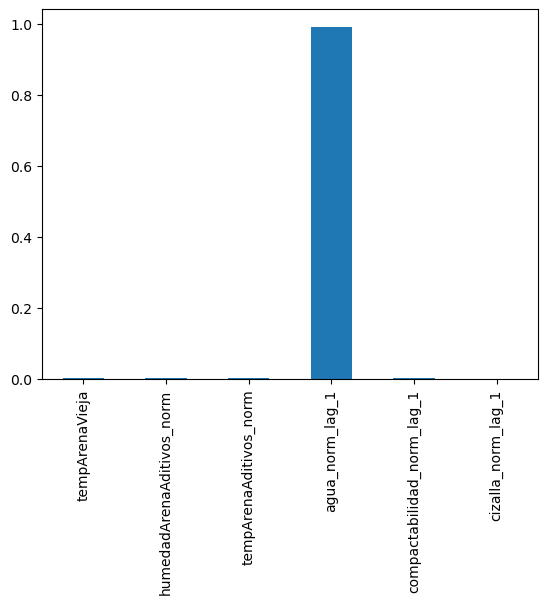

In [114]:
# Evaluación características
imp_caract_lag = rf_agua_lag_2.feature_importances_

rf_imp_lag = pd.Series(imp_caract_lag, index=X1.columns)
rf_imp_lag.plot.bar()

In [115]:
dump(rf_agua_lag_2, r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\modelos\M1_modelo_agua.joblib')

['C:\\Users\\a.sarrias\\OneDrive - Tafalla Iron Foundry S.COOP\\Documentos\\modelos\\M1_modelo_agua.joblib']

# Random Forest: MOLINO 2

In [82]:
# Definir la variable objetivo y las características para entrenamiento y test
col_y = 'agua_norm'

# Definir las columnas de los conjuntos X
cols_x = [
    'inicioSemana', 'bentonita_norm', 'finos_norm', 'premez_norm', 'premez_norm_lag_1', 
    'finos_norm_lag_1', 'tempArena_norm',
    'tempArena_norm_lag_1', 'humedadArenaAditivos_norm_lag_1', 'tempArenaAditivos_norm_lag_1', 
    'tempAgua_norm_lag_1', 'tiempoVacio_norm_lag_1', 
    'compactabilidad_norm_lag_1', 'cizalla_norm_lag_1', 
    'tempMezclaCalc_norm_lag_1', 'humedadMezclaCalc_norm_lag_1', 
    'bentonita_norm_lag_1','bentonita_norm_lag_2', 'premez_norm_lag_2', 'finos_norm_lag_2', 
    'tempArena_norm_lag_2', 'tempArena_norm_lag_2', 
    'humedadArenaAditivos_norm_lag_2', 
    'tempArenaAditivos_norm_lag_2', 'tempAgua_norm_lag_2', 
    'tiempoVacio_norm_lag_2', 'compactabilidad_norm_lag_2', 
    'cizalla_norm_lag_2', 'tempMezclaCalc_norm_lag_2', 
    'humedadMezclaCalc_norm_lag_2', 'agua_norm_lag_1', 'agua_norm_lag_2'
]

X2 = df_2[cols_x]
y2 = df_2[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_2))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data2 = df_2.iloc[:indice_80_percent, :]
test_data2 = df_2.iloc[indice_80_percent:, :]

X_train2 = train_data2[cols_x]
X_test2 = test_data2[cols_x]
y_train2 = train_data2[col_y]
y_test2 = test_data2[col_y]

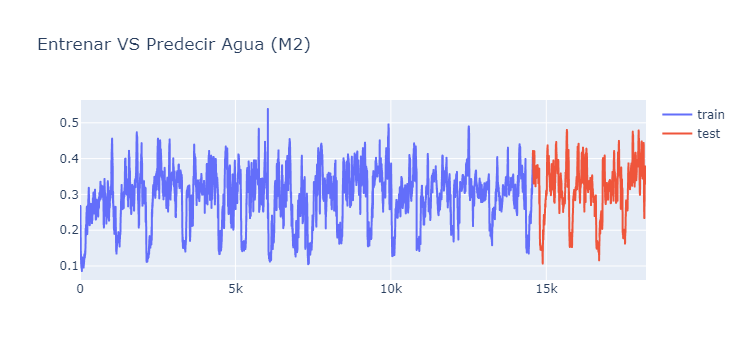

In [83]:
# aquí muestro con qué entrenamos al modelo y qué es lo que queremos predecir
fig = go.Figure()
fig.add_trace(go.Scattergl(x=X_train2.index, y=y_train2, mode='lines', name='train'))
fig.add_trace(go.Scattergl(x=X_test2.index, y=y_test2, mode='lines', name='test'))
fig.update_layout(title='Entrenar VS Predecir Agua (M2)')

fig.show()

In [84]:
# modelo random forest
rf_agua2 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua2.fit(X_train2, y_train2)
y_pred2 = rf_agua2.predict(X_test2)

# analizamos los residuos
res_test2 = y_test2 - y_pred2 

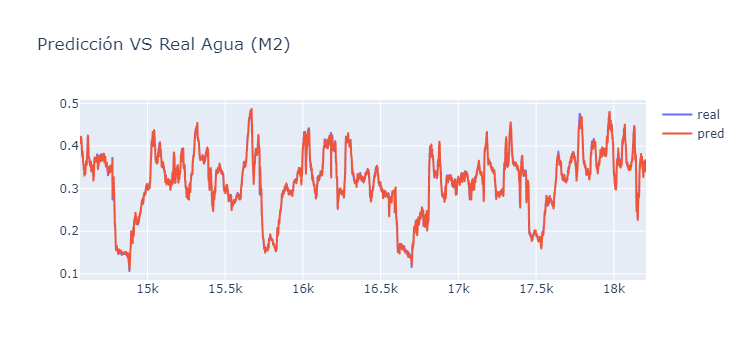

In [85]:
fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test2.index, y=y_test2, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test2.index, y=y_pred2, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua (M2)')

fig_pred1.show()

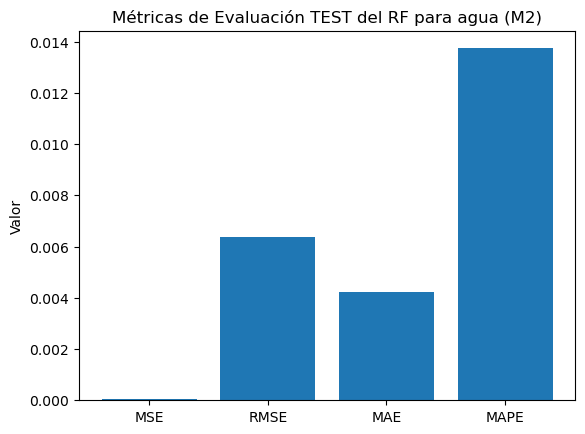

<Axes: >

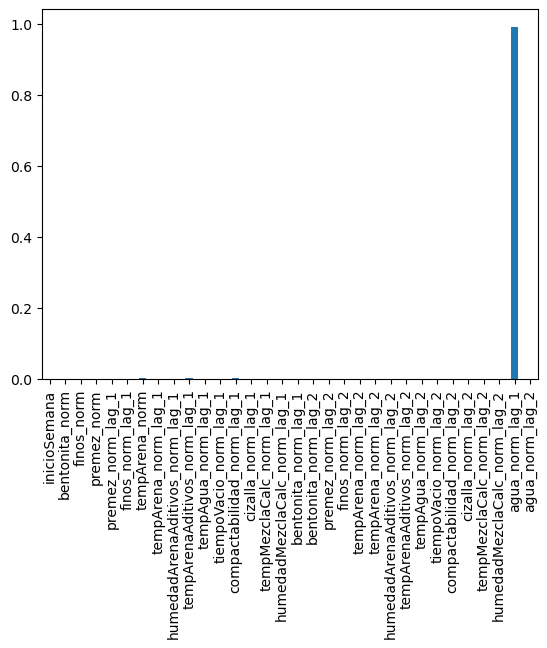

In [86]:
mae_test2 = mean_absolute_error(y_test2, y_pred2)
mse_test2 = mean_squared_error(y_test2, y_pred2)
rmse_test2 = np.sqrt(mse_test2)
mape_test2 = np.mean(np.abs(res_test2 / y_test2)[~np.isinf(np.abs(res_test2 / y_test2))])

metricas_test2 = {'MSE': mse_test2, 'RMSE': rmse_test2, 'MAE': mae_test2, 'MAPE': mape_test2}
plt.bar(metricas_test2.keys(), metricas_test2.values())
plt.title('Métricas de Evaluación TEST del RF para agua (M2)')
plt.ylabel('Valor')
plt.show()

importances2 = rf_agua2.feature_importances_

rf_imp2 = pd.Series(importances2, index=cols_x)
rf_imp2.plot.bar()

In [39]:
# df_red = df_2.iloc[:,:36]

In [87]:
col_y = 'agua_norm'

X2 = df_2.drop(columns=['agua_norm', 'codigoRef1', 'agua'])
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y2 = df_2[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_2))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data2 = df_2.iloc[:indice_80_percent, :]
test_data2 = df_2.iloc[indice_80_percent:, :]

X_train2 = train_data2.drop(columns=['agua_norm', 'codigoRef1', 'agua'])
X_test2 = test_data2.drop(columns=['agua_norm', 'codigoRef1', 'agua'])
y_train2 = train_data2[col_y]
y_test2 = test_data2[col_y]

In [88]:
# modelo random forest
rf_agua2 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua2.fit(X_train2, y_train2)
y_pred2 = rf_agua2.predict(X_test2)

# analizamos los residuos
res_test2 = y_test2 - y_pred2 

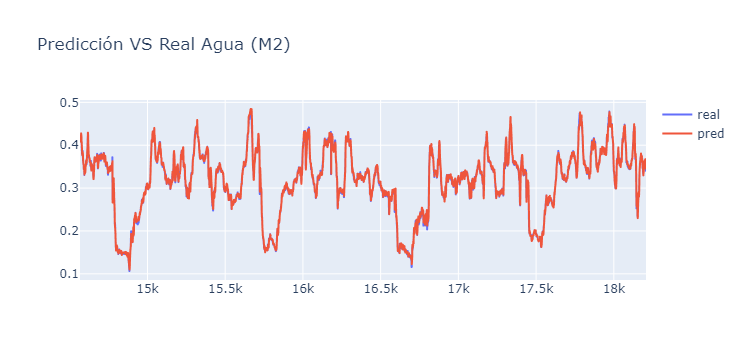

In [89]:
fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test2.index, y=y_test2, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test2.index, y=y_pred2, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua (M2)')

fig_pred1.show()

<Axes: >

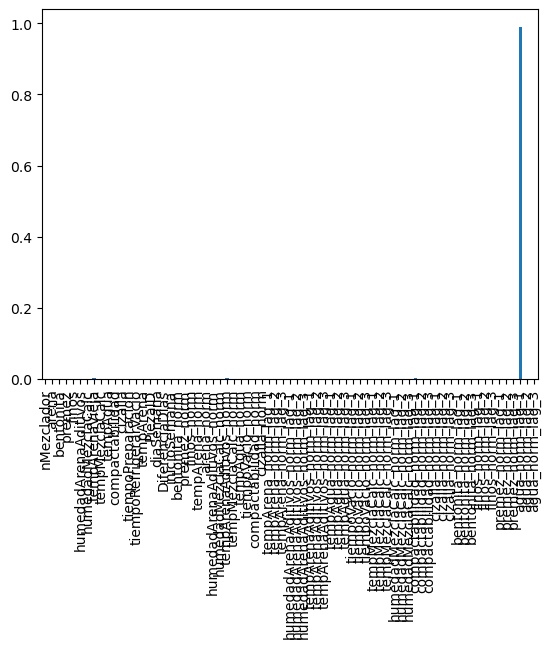

In [90]:
imp_caract = rf_agua2.feature_importances_

rf_imp = pd.Series(imp_caract, index=X2.columns)
rf_imp.plot.bar()

In [91]:
# sin lags
cols_guardar = ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm']

X2 = df_2[cols_guardar]
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y2 = df_2[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_2))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data = df_2.iloc[:indice_80_percent, :]
test_data = df_2.iloc[indice_80_percent:, :]

X_train = train_data[cols_guardar]
X_test = test_data[cols_guardar]
y_train = train_data[col_y]
y_test = test_data[col_y]

In [92]:
# con lag agua, compact y cizalla
cols_guardar = ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm', 'agua_norm_lag_1', 'compactabilidad_norm_lag_1',
               'cizalla_norm_lag_1']

X2 = df_2[cols_guardar]
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y2 = df_2[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_2))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data_lag_2 = df_2.iloc[:indice_80_percent, :]
test_data_lag_2 = df_2.iloc[indice_80_percent:, :]

X_train_lag_2 = train_data_lag_2[cols_guardar]
X_test_lag_2 = test_data_lag_2[cols_guardar]
y_train_lag_2 = train_data_lag_2[col_y]
y_test_lag_2 = test_data_lag_2[col_y]

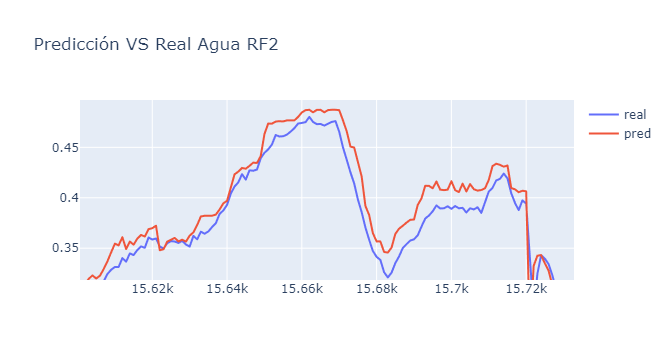

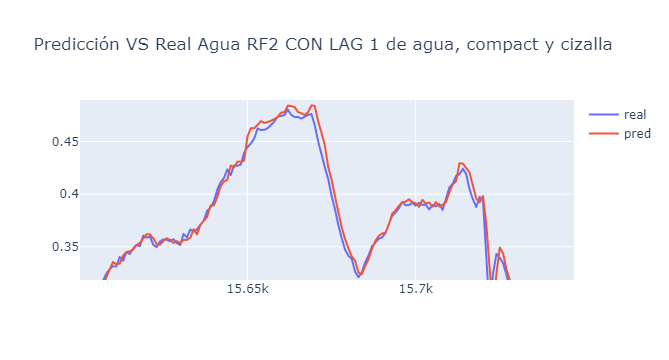

In [93]:
# normal
rf_agua2 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua2.fit(X_train, y_train)
y_pred2 = rf_agua2.predict(X_test)

# analizamos los residuos
res_test2 = y_test - y_pred2

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test.index, y=y_test, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test.index, y=y_pred2, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua RF2')

fig_pred1.show()


# con lag agua, compact y cizalla
rf_agua_lag_2 = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua_lag_2.fit(X_train_lag_2, y_train_lag_2)
y_pred_lag_2 = rf_agua_lag_2.predict(X_test_lag_2)

# analizamos los residuos
res_test_lag_2 = y_test_lag_2 - y_pred_lag_2

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test_lag_2.index, y=y_test_lag_2, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test_lag_2.index, y=y_pred_lag_2, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua RF2 CON LAG 1 de agua, compact y cizalla')

fig_pred1.show()

<Axes: >

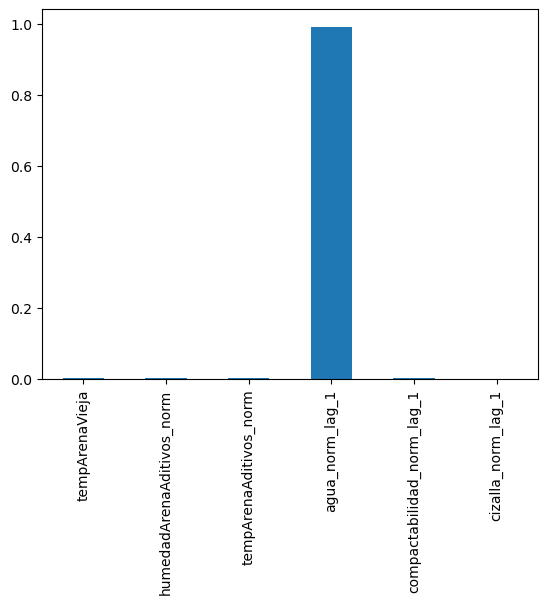

In [94]:
imp_caract_lag = rf_agua_lag_2.feature_importances_

rf_imp_lag = pd.Series(imp_caract_lag, index=X2.columns)
rf_imp_lag.plot.bar()

In [95]:
dump(rf_agua_lag_2, r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\modelos\M2_modelo_agua.joblib')


['C:\\Users\\a.sarrias\\OneDrive - Tafalla Iron Foundry S.COOP\\Documentos\\modelos\\M2_modelo_agua.joblib']

# Random Forest CONJUNTO de mezcladoras

In [49]:
archivo= r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\datos\hastaMayo.xlsx'

df_conjunto = pd.read_excel(archivo)

In [50]:
df_conjunto.head()

,nMezclador,fechaUltimaModificacion,usuarioUltimaModificacion,denominacionMezclador,falloSPS,comentario,SPS,turno,codigoRef1,arena,...,bentonita_norm_lag_3,finos_norm_lag_1,finos_norm_lag_2,finos_norm_lag_3,premez_norm_lag_1,premez_norm_lag_2,premez_norm_lag_3,agua_norm_lag_1,agua_norm_lag_2,agua_norm_lag_3
0,2,2024-01-08 19:26:58.977,NaN,mezclador 2,0,NaN,96860,12656,0000 discos,5933.0,...,0.307,0.118,0.116,0.120,0.186,0.176,0.182,0.3054,0.3086,0.3202
1,1,2024-01-08 19:38:06.603,NaN,mezclador 1,0,NaN,81320,12656,0000 discos,5851.0,...,0.311,0.119,0.118,0.116,0.186,0.186,0.176,0.3454,0.3054,0.3086
2,1,2024-01-08 19:44:06.520,NaN,mezclador 1,0,NaN,81321,12656,0000 discos,5933.0,...,0.311,0.117,0.119,0.118,0.177,0.186,0.186,0.3422,0.3454,0.3054
3,1,2024-01-08 20:12:41.613,NaN,mezclador 1,0,NaN,81322,12656,0000 discos,5860.0,...,0.311,0.121,0.117,0.119,0.183,0.177,0.186,0.2966,0.3422,0.3454
4,2,2024-01-08 20:14:53.993,NaN,mezclador 2,0,NaN,96861,12656,0000 discos,5903.0,...,0.312,0.117,0.121,0.117,0.179,0.183,0.177,0.2702,0.2966,0.3422


In [55]:
col_y = 'agua_norm'

# con lag agua, compact y cizalla
cols_guardar = ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm', 'agua_norm_lag_1', 'compactabilidad_norm_lag_1',
               'cizalla_norm_lag_1', 'nMezclador']

X1 = df_conjunto[cols_guardar]
# quito el agua pq es la variable a predecir, y quito las variables categóricas
y1 = df_conjunto[col_y]

# Obtener el índice que representa el 80% de los datos
indice_80_percent = int(0.8 * len(df_conjunto))

# Dividir el DataFrame en conjunto de entrenamiento y test
train_data_cj = df_conjunto.iloc[:indice_80_percent, :]
test_data_cj= df_conjunto.iloc[indice_80_percent:, :]

X_train_cj = train_data_cj[cols_guardar]
X_test_cj = test_data_cj[cols_guardar]
y_train_cj = train_data_cj[col_y]
y_test_cj = test_data_cj[col_y]

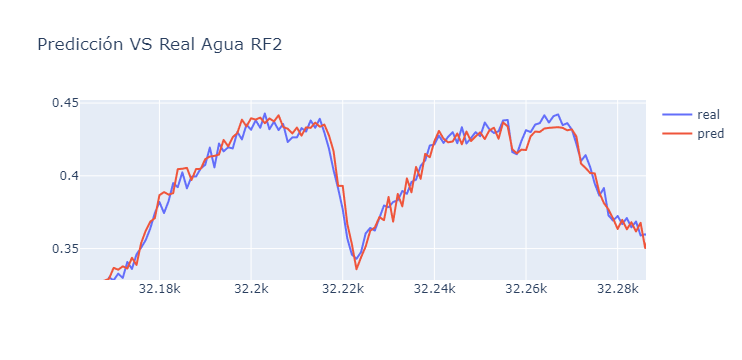

<Axes: >

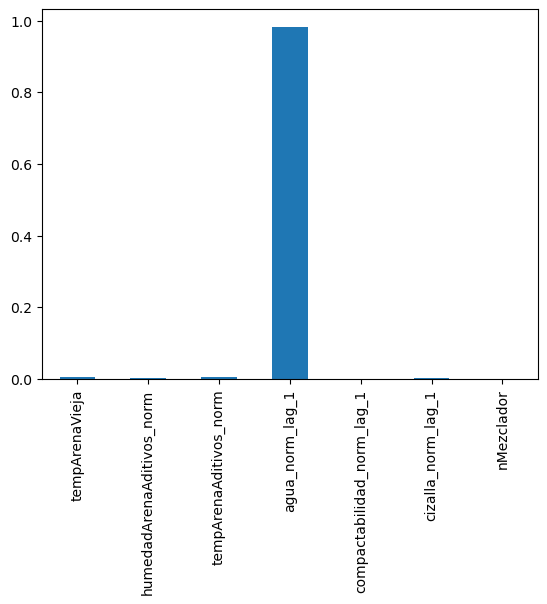

In [56]:
# normal
rf_agua_cj = RandomForestRegressor(
    n_estimators=50, random_state=42, 
    max_depth=10, min_samples_split=10, n_jobs=-1)

rf_agua_cj.fit(X_train_cj, y_train_cj)
y_pred_cj = rf_agua_cj.predict(X_test_cj)

# analizamos los residuos
res_test_cj = y_test_cj - y_pred_cj

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X_test_cj.index, y=y_test_cj, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X_test_cj.index, y=y_pred_cj, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua RF2')

fig_pred1.show()


imp_caract_cj = rf_agua_cj.feature_importances_

rf_imp_lag_cj = pd.Series(imp_caract_cj, index=X1.columns)
rf_imp_lag_cj.plot.bar()

In [58]:
dump(rf_agua_cj, r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\modelos\modelo_agua_cj.joblib')
# modelo agua conjunto ha sido entrenado de enero a abril, y test en mayo (más o menos)
# no es necesario añadir el nMezclador si ya se está metiendo el valor del agua normalizada anterior 

['C:\\Users\\a.sarrias\\OneDrive - Tafalla Iron Foundry S.COOP\\Documentos\\modelos\\modelo_agua_cj.joblib']

# PREDICCIÓN DATOS ACTUALES CON EL ÚLTIMO MODELO RF (modelo_agua_rf)

In [23]:
# Especifica la ruta del archivo Excel
archivo_excel_1 = r'C:\Users\a.sarrias\OneDrive - Tafalla Iron Foundry S.COOP\Documentos\datos\datos_hasta8abril24_M1.xlsx'
# archivo_excel_2 = r'C:\Users\a.sarrias\Documents\datos\datos_hasta8abril24_M2.xlsx'


# Carga los datos del archivo Excel en un DataFrame
df_hasta8abril_M1 = pd.read_excel(archivo_excel_1)
# df_hasta8abril_M2 = pd.read_excel(archivo_excel_2)

rf_agua_m1 = load(r'C:\Users\a.sarrias\Documents\modelos\modelo_agua_rf_MOLINO1.joblib')

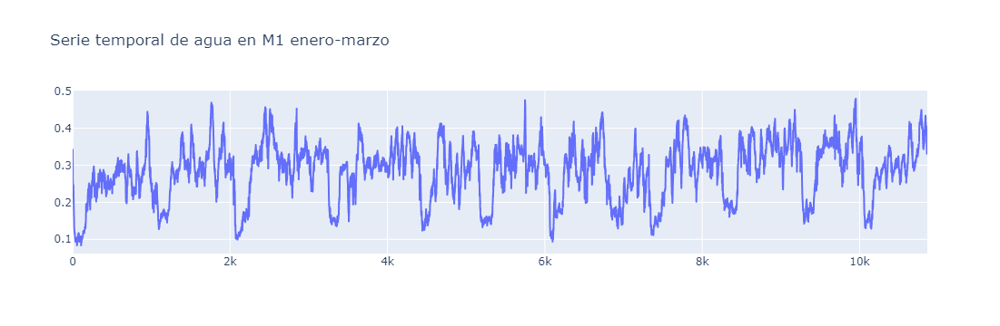

In [24]:
fig = go.Figure()
fig.add_trace(go.Scattergl(x=df_hasta8abril_M1.index,y=df_hasta8abril_M1.agua_norm,name='norm'))
fig.update_layout(title='Serie temporal de agua en M1 enero-marzo')

fig.show()

In [25]:
## actualidad con el nuevo modelo Random Forest

# Definir la variable objetivo y las características para entrenamiento y test
col_y = 'agua_norm'
cols_guardar = ['tempArenaVieja', 'humedadArenaAditivos_norm',
               'tempArenaAditivos_norm', 'agua_norm_lag_1', 'compactabilidad_norm_lag_1',
               'cizalla_norm_lag_1']

# como el modelo ya está entrenado, solo hace falta predecir
X1 = df_hasta8abril_M1[cols_guardar] 
y1 = df_hasta8abril_M1[col_y]

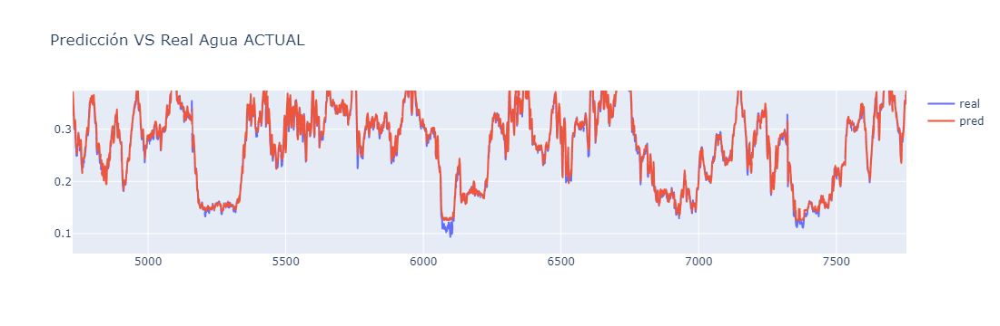

In [26]:
y_pred_actual = rf_agua_m1.predict(X1)

# analizamos los residuos
res_actual = y1 - y_pred_actual

fig_pred1 = go.Figure()
fig_pred1.add_trace(go.Scattergl(x=X1.index, y=y1, mode='lines', name='real'))
fig_pred1.add_trace(go.Scattergl(x=X1.index, y=y_pred_actual, mode='lines', name='pred'))
fig_pred1.update_layout(title='Predicción VS Real Agua ACTUAL')

fig_pred1.show()

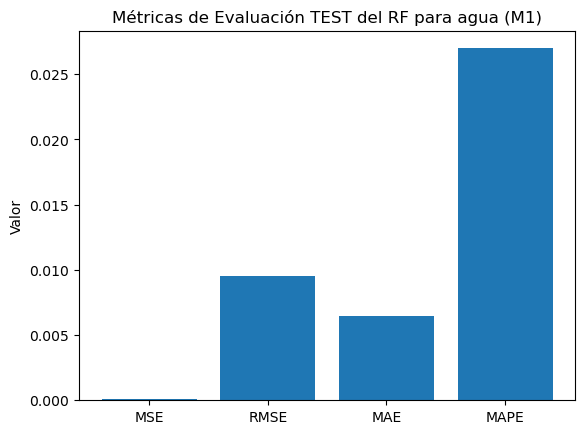

In [27]:
# Evaluación del modelo

mae_test_act = mean_absolute_error(y1, y_pred_actual)
mse_test_act = mean_squared_error(y1, y_pred_actual)
rmse_test_act = np.sqrt(mse_test_act)
mape_test_act = np.mean(np.abs(res_actual / y1)[~np.isinf(np.abs(res_actual / y1))])

metricas_test = {'MSE': mse_test_act, 'RMSE': rmse_test_act, 'MAE': mae_test_act, 'MAPE': mape_test_act}
plt.bar(metricas_test.keys(), metricas_test.values())
plt.title('Métricas de Evaluación TEST del RF para agua (M1)')
plt.ylabel('Valor')
plt.show()